# `EmissionAbsorptionPhysicalModel` Tutorial

Trey V. Wenger (c) June 2025

`EmissionAbsorptionPhysicalModel` is a re-parameterization of `EmissionAbsorptionModel` that places more physically motivated constraints on the parameter space.

In [1]:
# General imports    
import time

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
import pymc as pm

print("pymc version:", pm.__version__)
print("arviz version:", az.__version__)

import bayes_spec
print("bayes_spec version:", bayes_spec.__version__)

import caribou_hi
print("caribou_hi version:", caribou_hi.__version__)

# Notebook configuration
pd.options.display.max_rows = None

pymc version: 5.22.0
arviz version: 0.22.0dev
bayes_spec version: 1.7.9
caribou_hi version: 3.0.0+0.g3a96afe.dirty


## Simulating Data

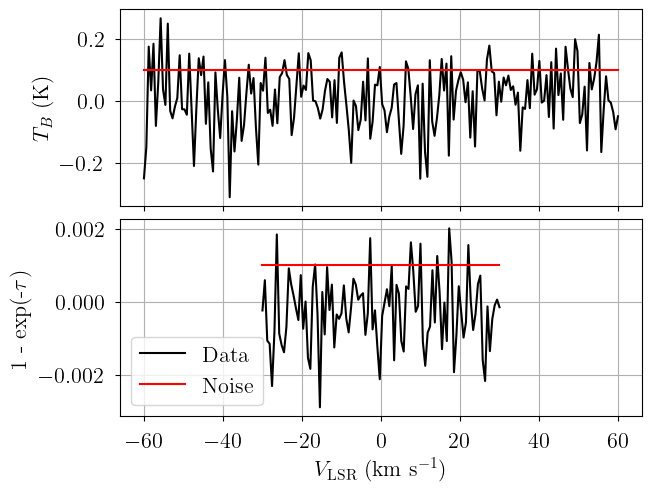

In [2]:
from bayes_spec import SpecData

# spectral axes definitions
emission_axis = np.linspace(-60.0, 60.0, 200)  # km s-1
absorption_axis = np.linspace(-30.0, 30.0, 100)  # km s-1

# data noise can either be a scalar (assumed constant noise across the spectrum)
# or an array of the same length as the data
rms_emission = 0.1  # K
rms_absorption = 0.001  # 1 - exp(-tau)

# brightness data. In this case, we just throw in some random data for now
# since we are only doing this in order to simulate some actual data.
emission = rms_emission * np.random.randn(len(emission_axis))
absorption = rms_absorption * np.random.randn(len(absorption_axis))

dummy_data = {
    "emission": SpecData(
        emission_axis,
        emission,
        rms_emission,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"$T_B$ (K)",
    ),
    "absorption": SpecData(
        absorption_axis,
        absorption,
        rms_absorption,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"1 - exp(-$\tau$)",
    ),
}

# Plot dummy data
fig, axes = plt.subplots(2, layout="constrained", sharex=True)
axes[0].plot(dummy_data["emission"].spectral, dummy_data["emission"].brightness, "k-")
axes[0].plot(dummy_data["emission"].spectral, dummy_data["emission"].noise, "r-")
axes[1].plot(dummy_data["absorption"].spectral, dummy_data["absorption"].brightness, "k-", label="Data")
axes[1].plot(dummy_data["absorption"].spectral, dummy_data["absorption"].noise, "r-", label="Noise")
axes[1].set_xlabel(dummy_data["emission"].xlabel)
axes[0].set_ylabel(dummy_data["emission"].ylabel)
axes[1].set_ylabel(dummy_data["absorption"].ylabel)
_ = axes[1].legend(loc="lower left")

In [3]:
from caribou_hi import EmissionAbsorptionPhysicalModel

# Initialize and define the model
n_clouds = 3
baseline_degree = 0
model = EmissionAbsorptionPhysicalModel(
    dummy_data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    depth_nth_fwhm_power = 1/3, # assumed non-thermal FWHM vs. depth power law index
    bg_temp = 3.77, # assumed background temperature (K)
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_ff_NHI=1.0e21,  # filling factor * column density prior width (cm-2)
    prior_fwhm2_thermal_fraction=[2.0, 2.0], # thermal FWHM^2 fraction prior shape
    prior_sigma_log10_NHI=0.5, # log-normal column density distribution width
    prior_fwhm2=200.0, # FWHM^2 prior width (km2 s-2)
    prior_velocity=[5.0, 5.0], # velocity prior mean and width (km/s)
    prior_n_alpha=1.0e-6,  # n_alpha prior width (cm-3)
    prior_nth_fwhm_1pc=[1.75, 0.25], # non-thermal FWHM at 1 pc prior mean and width (km s-1)
    prior_fwhm_L=None, # Assume Gaussian line profile
    prior_baseline_coeffs=None, # Default baseline priors
)
model.add_likelihood()

In [4]:
from caribou_hi import physics

# Simulation parameters
filling_factor = np.array([0.2, 0.8, 1.0])
absorption_weight = np.array([0.9, 0.8, 1.0])
log10_nHI = np.array([1.25, 0.0, -0.5])
tkin = np.array([50.0, 300.0, 5000.0])
n_alpha = np.array([1.0e-6, 2.0e-6, 3.0e-6])
depth = np.array([5.0, 25.0, 300.0])
nth_fwhm_1pc = np.array([2.0, 1.75, 1.5])

tspin = physics.calc_spin_temp(tkin, 10.0**log10_nHI, n_alpha).eval()
print("tspin", tspin)

fwhm2_nonthermal = physics.calc_nonthermal_fwhm(depth, nth_fwhm_1pc, 1/3)**2.0
print("fwhm2_nonthermal", fwhm2_nonthermal)

fwhm2_thermal = physics.calc_thermal_fwhm2(tkin)
print("fwhm2_thermal", fwhm2_thermal)

fwhm2 = fwhm2_nonthermal + fwhm2_thermal
print("fwhm2", fwhm2)

fwhm2_thermal_fraction = fwhm2_thermal/fwhm2
print("fwhm2_thermal_fraction", fwhm2_thermal_fraction)

log10_Pth = np.log10(tkin) + log10_nHI
print("log10_Pth", log10_Pth)

log10_NHI = log10_nHI + np.log10(depth) + 18.489351
print("log10_NHI", log10_NHI)

tau_total = physics.calc_tau_total(10.0**log10_NHI, tspin)
print("tau_total", tau_total)

#wt_ff_tspin = absorption_weight / filling_factor / tspin
#print("wt_ff_tspin", wt_ff_tspin)
wt_ff_fwhm2_thermal = absorption_weight / filling_factor / fwhm2_thermal
print("wt_ff_fwhm2_thermal", wt_ff_fwhm2_thermal)

sim_params = {
    "wt_ff_fwhm2_thermal": wt_ff_fwhm2_thermal,
    "absorption_weight": absorption_weight,
    "filling_factor": filling_factor,
    "log10_NHI": log10_NHI,
    "tau_total": tau_total,
    "tspin": tspin,
    "fwhm2": fwhm2,
    "fwhm2_thermal_fraction": fwhm2_thermal_fraction,
    "velocity": np.array([-5.0, 5.0, 10.0]),
    "n_alpha": n_alpha,
    "nth_fwhm_1pc": nth_fwhm_1pc,
    "baseline_absorption_norm": [0.0],
}

# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observation
emission = model.model["emission"].eval(sim_params, on_unused_input="ignore")
absorption = model.model["absorption"].eval(sim_params, on_unused_input="ignore")

data = {
    "emission": SpecData(
        emission_axis,
        emission,
        rms_emission,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"$T_B$ (K)",
    ),
    "absorption": SpecData(
        absorption_axis,
        absorption,
        rms_absorption,
        xlabel=r"$V_{\rm LSR}$ (km s$^{-1}$)",
        ylabel=r"1 - exp(-$\tau$)",
    ),
}

tspin [  49.97911226  298.78900835 4259.26982821]
fwhm2_nonthermal [ 11.69607095  26.18400668 100.8316068 ]
fwhm2_thermal [  2.2876605  13.725963  228.76605  ]
fwhm2 [ 13.98373145  39.90996968 329.5976568 ]
fwhm2_thermal_fraction [0.16359442 0.34392316 0.69407669]
log10_Pth [2.94897    2.47712125 3.19897   ]
log10_NHI [20.438321   19.88729101 20.46647225]
tau_total [3.01218479 0.14166923 0.03771258]
wt_ff_fwhm2_thermal [1.9670751  0.07285463 0.00437128]


In [5]:
sim_params

{'wt_ff_fwhm2_thermal': array([1.9670751 , 0.07285463, 0.00437128]),
 'absorption_weight': array([0.9, 0.8, 1. ]),
 'filling_factor': array([0.2, 0.8, 1. ]),
 'log10_NHI': array([20.438321  , 19.88729101, 20.46647225]),
 'tau_total': array([3.01218479, 0.14166923, 0.03771258]),
 'tspin': array([  49.97911226,  298.78900835, 4259.26982821]),
 'fwhm2': array([ 13.98373145,  39.90996968, 329.5976568 ]),
 'fwhm2_thermal_fraction': array([0.16359442, 0.34392316, 0.69407669]),
 'velocity': array([-5.,  5., 10.]),
 'n_alpha': array([1.e-06, 2.e-06, 3.e-06]),
 'nth_fwhm_1pc': array([2.  , 1.75, 1.5 ]),
 'baseline_absorption_norm': [0.0],
 'fwhm2_thermal': array([  2.2876605,  13.725963 , 228.76605  ]),
 'tkin': array([  50.,  300., 5000.]),
 'fwhm2_nonthermal': array([ 11.69607095,  26.18400668, 100.8316068 ]),
 'depth': array([  5.,  25., 300.]),
 'log10_nHI': array([ 1.25,  0.  , -0.5 ]),
 'log10_Pth': array([2.94897   , 2.47712125, 3.19897   ]),
 'log10_Pnth': array([5.14527999, 4.2452761 ,

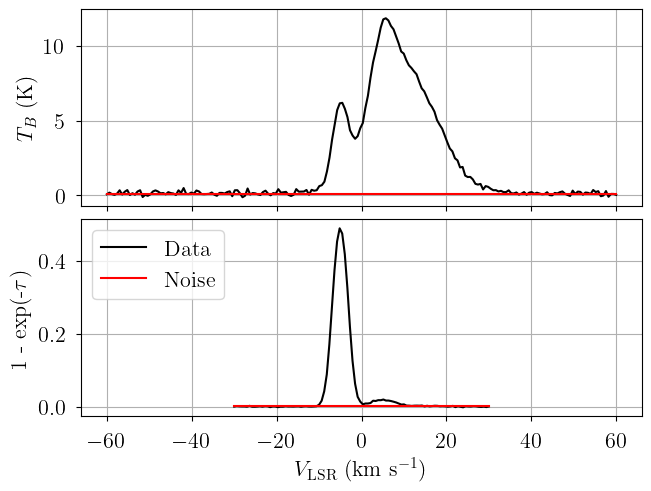

In [6]:
# Plot data
fig, axes = plt.subplots(2, layout="constrained", sharex=True)
axes[0].plot(data["emission"].spectral, data["emission"].brightness, "k-")
axes[0].plot(data["emission"].spectral, data["emission"].noise, "r-")
axes[1].plot(data["absorption"].spectral, data["absorption"].brightness, "k-", label="Data")
axes[1].plot(data["absorption"].spectral, data["absorption"].noise, "r-", label="Noise")
axes[1].set_xlabel(data["emission"].xlabel)
axes[0].set_ylabel(data["emission"].ylabel)
axes[1].set_ylabel(data["absorption"].ylabel)
_ = axes[1].legend(loc="upper left")

## Model Definition

In [7]:
# Initialize and define the model
model = EmissionAbsorptionPhysicalModel(
    data,
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    depth_nth_fwhm_power = 1/3, # assumed non-thermal FWHM vs. depth power law index
    bg_temp = 3.77, # assumed background temperature (K)
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_ff_NHI=1.0e21,  # filling factor * column density prior width (cm-2)
    prior_fwhm2_thermal_fraction=[2.0, 2.0], # thermal FWHM^2 fraction prior shape
    prior_sigma_log10_NHI=0.5, # log-normal column density distribution width
    prior_fwhm2=200.0, # FWHM^2 prior width (km2 s-2)
    prior_velocity=[5.0, 5.0], # velocity prior mean and width (km/s)
    prior_n_alpha=1.0e-6,  # n_alpha prior width (cm-3)
    prior_nth_fwhm_1pc=[1.75, 0.25], # non-thermal FWHM at 1 pc prior mean and width (km s-1)
    prior_fwhm_L=None, # Assume Gaussian line profile
    prior_baseline_coeffs=None, # Default baseline priors
)
model.add_likelihood()

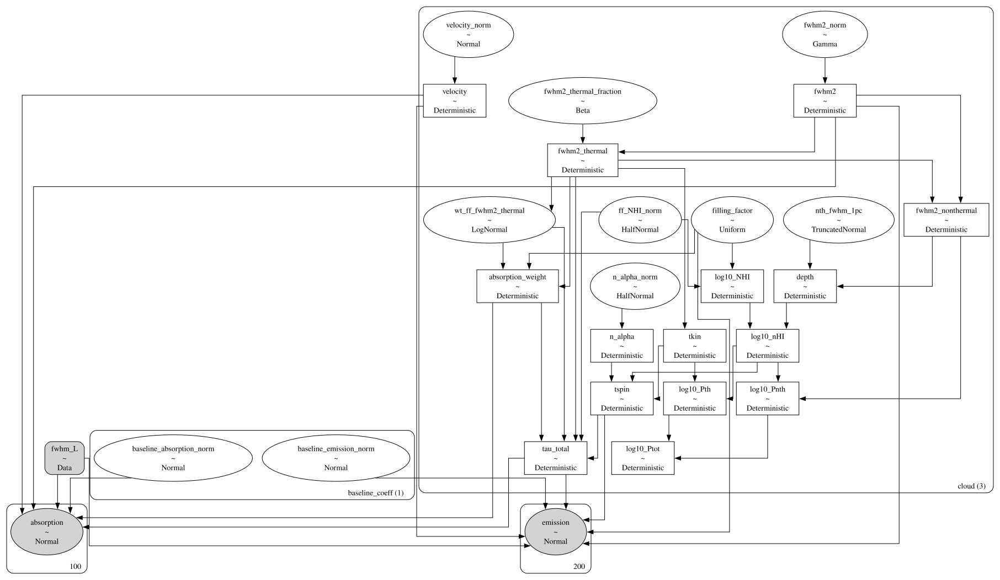

In [8]:
# Plot model graph
model.graph().render("emission_absorption_physical_model", format="png")
model.graph()

In [9]:
# model string representation
print(model.model.str_repr())

  baseline_emission_norm ~ Normal(0, 1)
baseline_absorption_norm ~ Normal(0, 1)
              fwhm2_norm ~ Gamma(0.5, f())
           velocity_norm ~ Normal(0, 1)
            n_alpha_norm ~ HalfNormal(0, 1)
            nth_fwhm_1pc ~ TruncatedNormal(1.75, 0.25, 0, inf)
             ff_NHI_norm ~ HalfNormal(0, 1)
  fwhm2_thermal_fraction ~ Beta(2, 2)
          filling_factor ~ Uniform(0, 1)
     wt_ff_fwhm2_thermal ~ LogNormal(f(fwhm2_thermal_fraction, fwhm2_norm), 1.15)
                   fwhm2 ~ Deterministic(f(fwhm2_norm))
                velocity ~ Deterministic(f(velocity_norm))
                 n_alpha ~ Deterministic(f(n_alpha_norm))
           fwhm2_thermal ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
                    tkin ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
        fwhm2_nonthermal ~ Deterministic(f(fwhm2_thermal_fraction, fwhm2_norm))
                   depth ~ Deterministic(f(nth_fwhm_1pc, fwhm2_thermal_fraction, fwhm2_norm))
               log

Sampling: [absorption, baseline_absorption_norm, baseline_emission_norm, emission, ff_NHI_norm, filling_factor, fwhm2_norm, fwhm2_thermal_fraction, n_alpha_norm, nth_fwhm_1pc, velocity_norm, wt_ff_fwhm2_thermal]


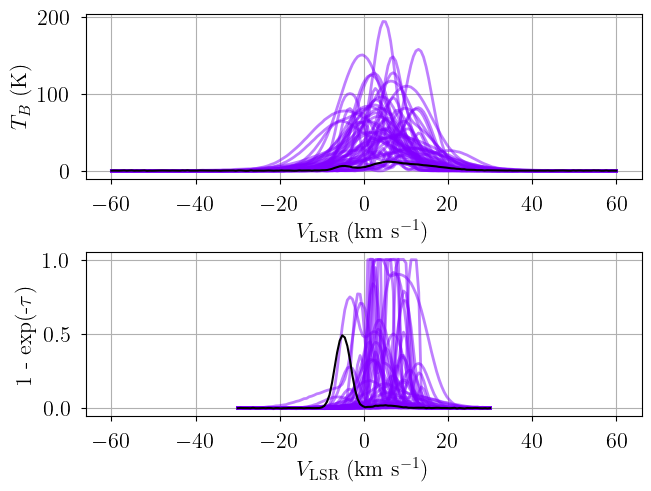

In [10]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
axes = plot_predictive(model.data, prior.prior_predictive.sel(draw=slice(None, None, 20)))
axes.ravel()[1].sharex(axes.ravel()[0])

In [11]:
print(model.cloud_freeRVs)
print(model.cloud_deterministics)

['fwhm2_norm', 'velocity_norm', 'n_alpha_norm', 'nth_fwhm_1pc', 'ff_NHI_norm', 'fwhm2_thermal_fraction', 'filling_factor', 'wt_ff_fwhm2_thermal']
['fwhm2', 'velocity', 'n_alpha', 'fwhm2_thermal', 'tkin', 'fwhm2_nonthermal', 'depth', 'log10_NHI', 'log10_nHI', 'tspin', 'absorption_weight', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot']


['fwhm2', 'velocity', 'n_alpha', 'fwhm2_thermal', 'tkin', 'fwhm2_nonthermal', 'depth', 'log10_NHI', 'log10_nHI', 'tspin', 'absorption_weight', 'tau_total', 'log10_Pth', 'log10_Pnth', 'log10_Ptot', 'nth_fwhm_1pc', 'fwhm2_thermal_fraction', 'filling_factor', 'wt_ff_fwhm2_thermal']


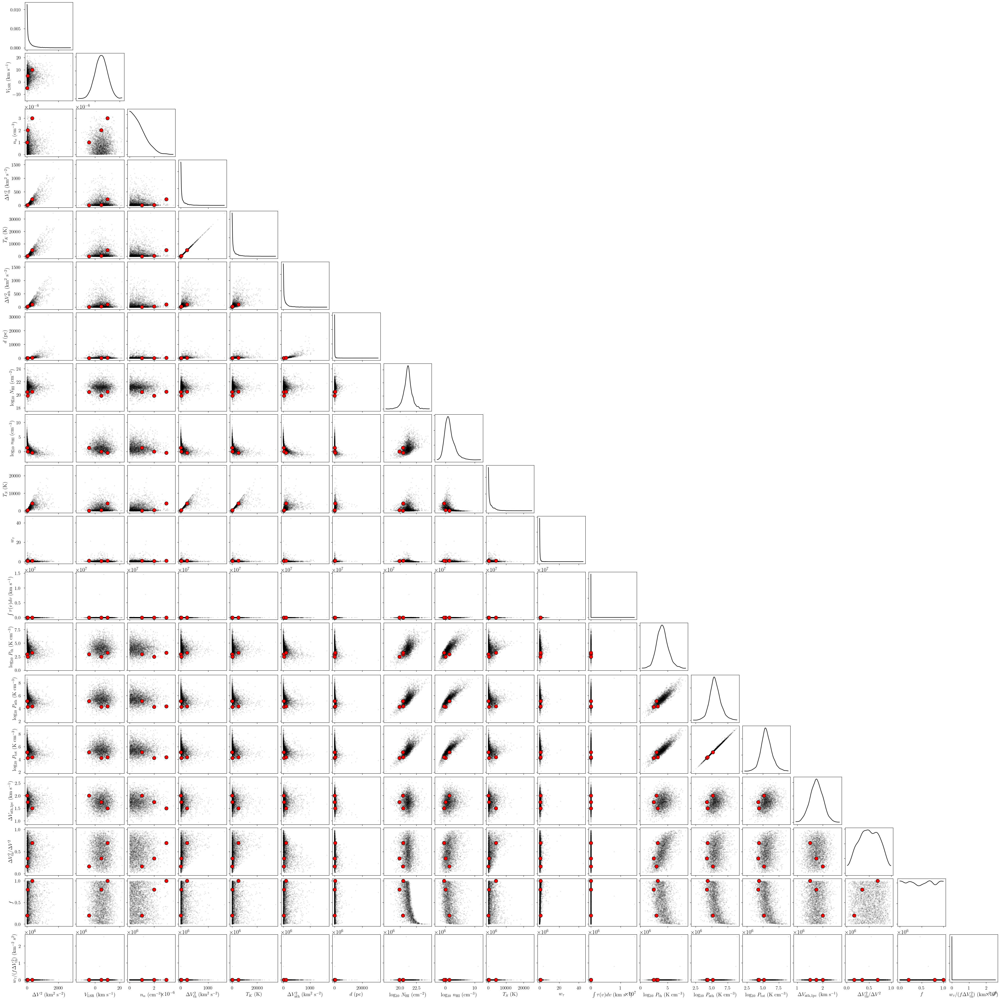

In [12]:
from bayes_spec.plots import plot_pair

var_names = model.cloud_deterministics + [p for p in model.cloud_freeRVs if "_norm" not in p]
print(var_names)
_ = plot_pair(
    prior.prior, # samples
    var_names, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

## Variational Inference

In [13]:
start = time.time()
model.fit(
    n = 1_000_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.01, # VI absolute convergence threshold
    learning_rate = 0.001, # VI learning rate
    start = {"velocity_norm": np.linspace(-3.0, 3.0, model.n_clouds)},
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 51200
Interrupted at 51,199 [5%]: Average Loss = 3.8575e+05


Adding log-likelihood to trace


Output()

Runtime: 1.74 minutes


In [14]:
pm.summary(model.trace.posterior)

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_emission_norm[0],1.415,0.073,1.282,1.554,0.003,0.002,821.0,785.0,NaN
baseline_absorption_norm[0],-0.085,0.103,-0.279,0.111,0.003,0.002,955.0,901.0,NaN
velocity_norm[0],-0.001,0.006,-0.011,0.010,0.000,0.000,937.0,853.0,NaN
velocity_norm[1],-2.000,0.000,-2.001,-1.999,0.000,0.000,1001.0,1014.0,NaN
velocity_norm[2],0.975,0.006,0.964,0.986,0.000,0.000,997.0,748.0,NaN
fwhm2_norm[0],0.198,0.004,0.191,0.204,0.000,0.000,923.0,605.0,NaN
fwhm2_norm[1],0.070,0.000,0.070,0.070,0.000,0.000,1018.0,934.0,NaN
fwhm2_norm[2],1.632,0.010,1.614,1.650,0.000,0.000,1032.0,1023.0,NaN
n_alpha_norm[0],0.866,0.764,0.036,2.096,0.026,0.056,1023.0,881.0,NaN
n_alpha_norm[1],0.011,0.000,0.010,0.011,0.000,0.000,867.0,872.0,NaN


Sampling: [absorption, emission]


Output()

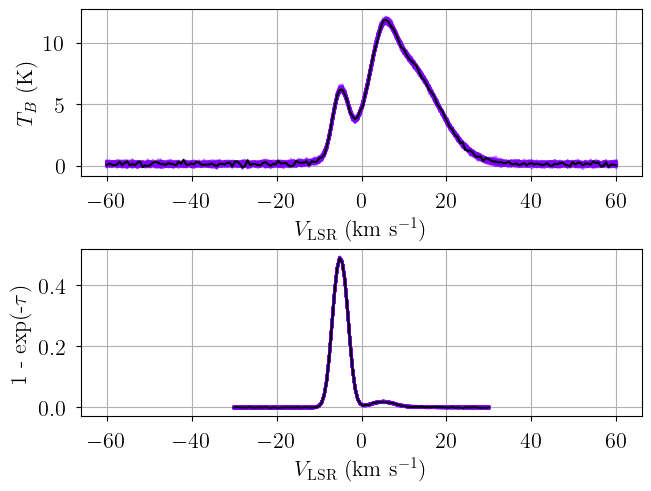

In [15]:
posterior = model.sample_posterior_predictive(
    thin=10,  # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
axes.ravel()[1].sharex(axes.ravel()[0])

## Posterior Sampling: MCMC

We can sample from the posterior distribution using MCMC.

In [16]:
start = time.time()
model.sample(
    init="advi+adapt_diag",  # initialization strategy
    tune=1000,  # tuning samples
    draws=1000,  # posterior samples
    chains=8,  # number of independent chains
    cores=8,  # number of parallel chains
    init_kwargs={
        "rel_tolerance": 0.01,
        "abs_tolerance": 0.01,
        "learning_rate": 0.001,
        "start": {"velocity_norm": np.linspace(-3.0, 3.0, model.n_clouds)},
    },  # VI initialization arguments
    nuts_kwargs={"target_accept": 0.9},  # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 51200
Interrupted at 51,199 [5%]: Average Loss = 3.8575e+05
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_emission_norm, baseline_absorption_norm, fwhm2_norm, velocity_norm, n_alpha_norm, nth_fwhm_1pc, ff_NHI_norm, fwhm2_thermal_fraction, filling_factor, wt_ff_fwhm2_thermal]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 161 seconds.


Adding log-likelihood to trace


Output()

Runtime: 4.85 minutes


In [17]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


Check that the effective sample sizes are large and the covergence statistic `r_hat` is close to 1! If not, you may have to increase the number of tuning steps (`tune=2000`) or the NUTS acceptance rate (`target_accept=0.9`).

In [18]:
print("solutions:", model.solutions)
az.summary(model.trace["solution_0"])
# this also works: az.summary(model.trace.solution_0)

solutions: [0]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_emission_norm[0],1.412,0.087,1.246,1.571,0.001,0.001,7913.0,6403.0,1.0
baseline_absorption_norm[0],-0.098,0.146,-0.366,0.180,0.002,0.001,7089.0,6230.0,1.0
velocity_norm[0],0.000,0.008,-0.013,0.015,0.000,0.000,4647.0,6013.0,1.0
velocity_norm[1],-2.000,0.000,-2.001,-2.000,0.000,0.000,8039.0,5806.0,1.0
velocity_norm[2],0.975,0.017,0.944,1.007,0.000,0.000,2290.0,4458.0,1.0
fwhm2_norm[0],0.197,0.008,0.182,0.213,0.000,0.000,3218.0,5108.0,1.0
fwhm2_norm[1],0.070,0.000,0.070,0.070,0.000,0.000,7691.0,6454.0,1.0
fwhm2_norm[2],1.631,0.021,1.591,1.670,0.000,0.000,3412.0,4763.0,1.0
n_alpha_norm[0],0.787,0.602,0.001,1.875,0.007,0.007,4957.0,2623.0,1.0
n_alpha_norm[1],0.801,0.617,0.000,1.919,0.007,0.008,4404.0,1339.0,1.0


We generate posterior predictive checks as well as a trace plot of the individual chains. In the posterior predictive plot, we show each chain as a different color. Each line is one posterior sample.

Sampling: [absorption, emission]


Output()

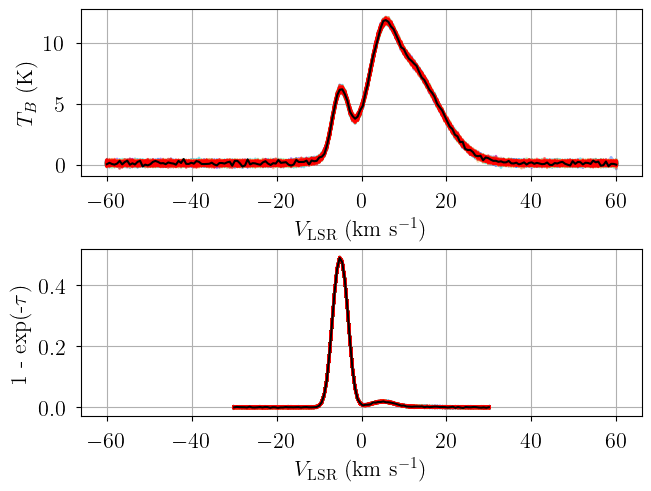

In [19]:
posterior = model.sample_posterior_predictive(
    thin=10,  # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
axes.ravel()[0].sharex(axes.ravel()[1])

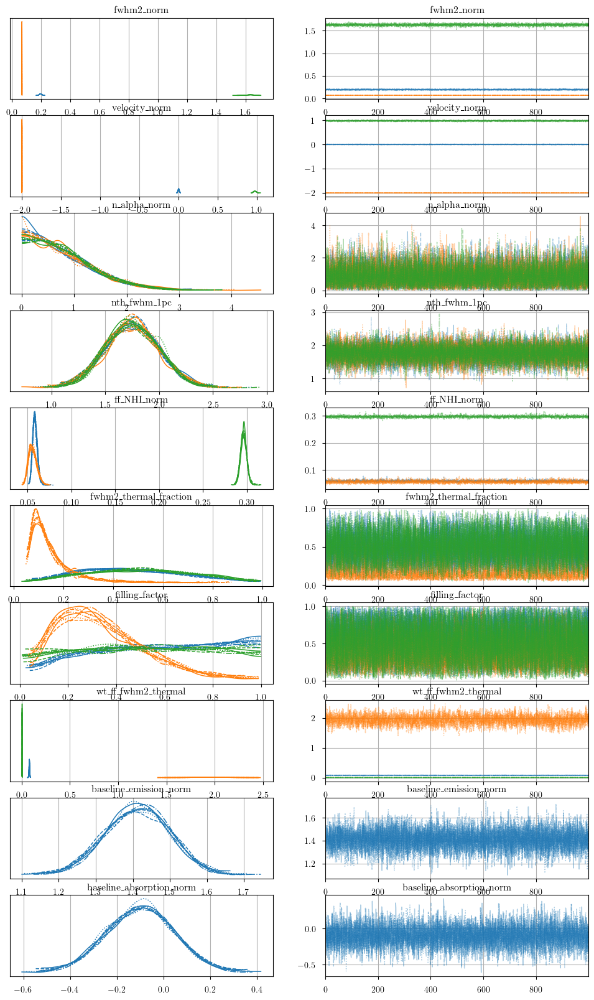

In [20]:
from bayes_spec.plots import plot_traces

_ = plot_traces(model.trace.posterior, model.cloud_freeRVs + model.baseline_freeRVs + model.hyper_freeRVs)

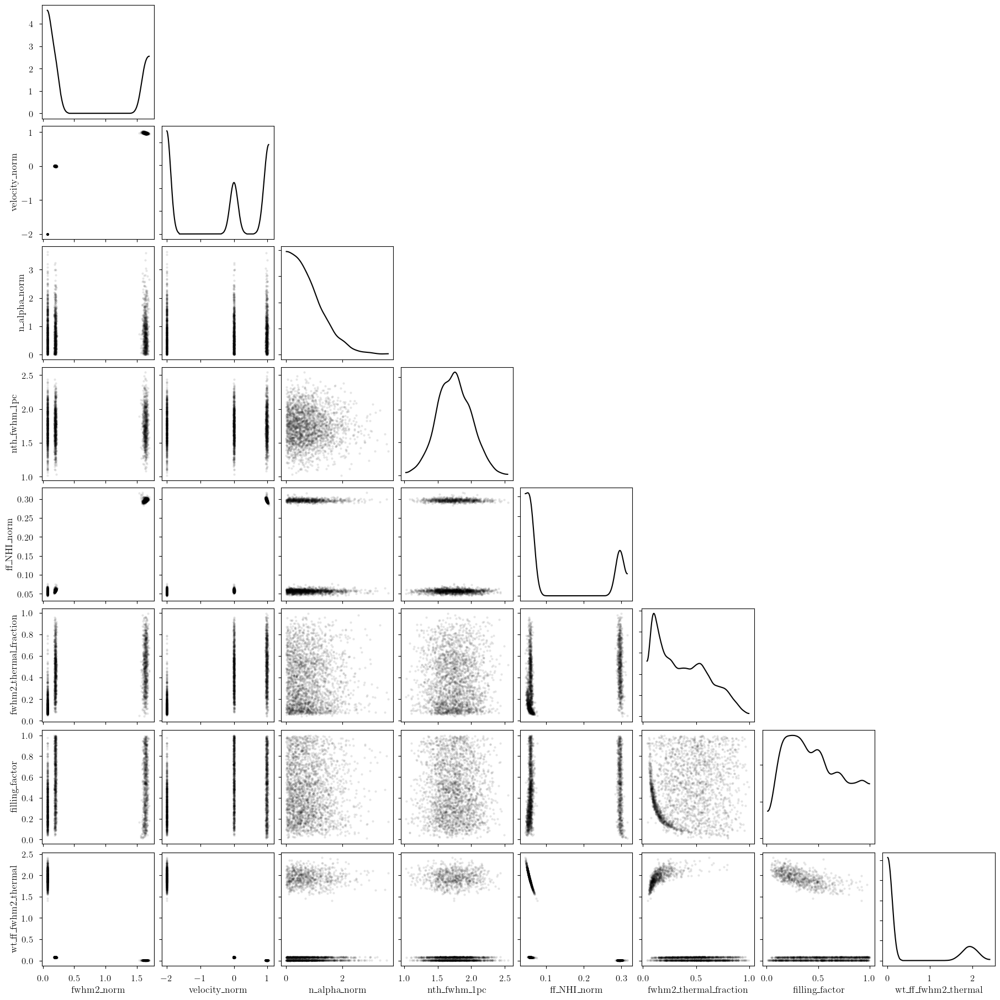

In [21]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    kind="scatter", # plot type
)

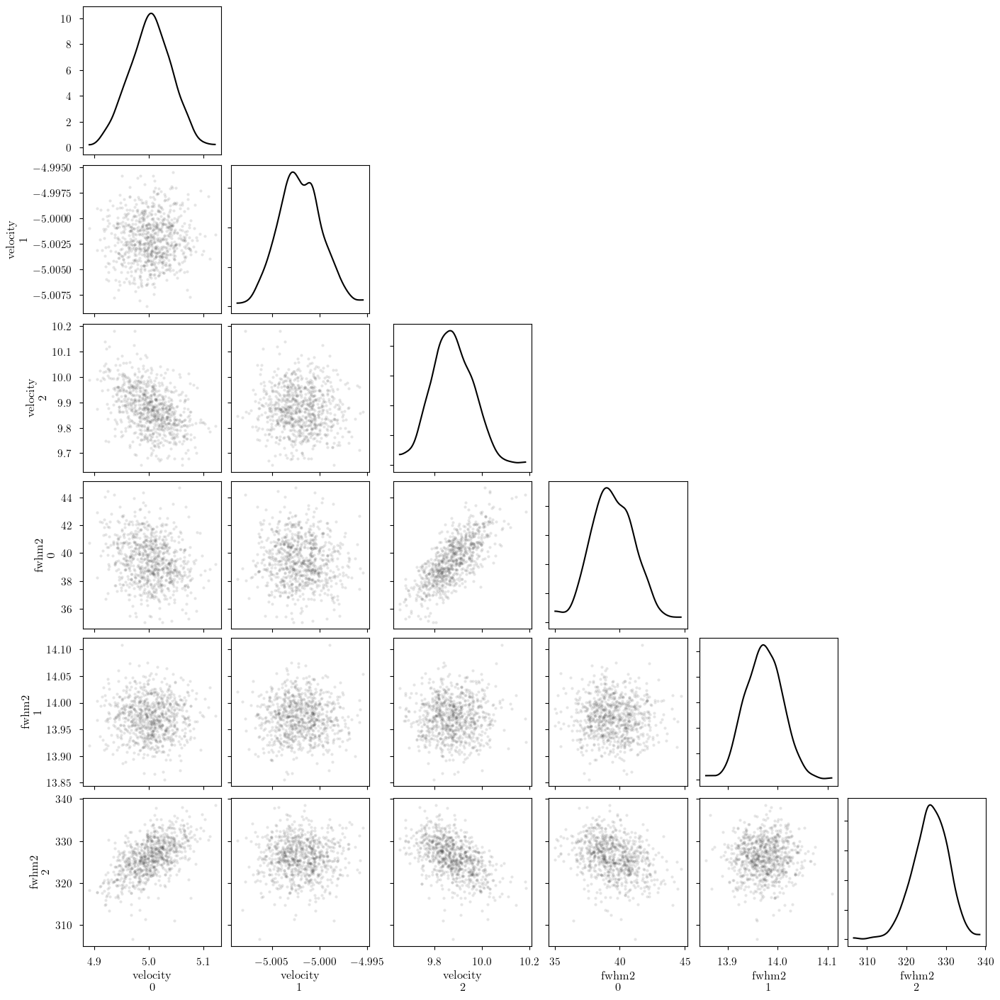

In [22]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    ["velocity", "fwhm2"], # var_names to plot
    combine_dims=None, # do not concatenate clouds
    kind="scatter", # plot type
)

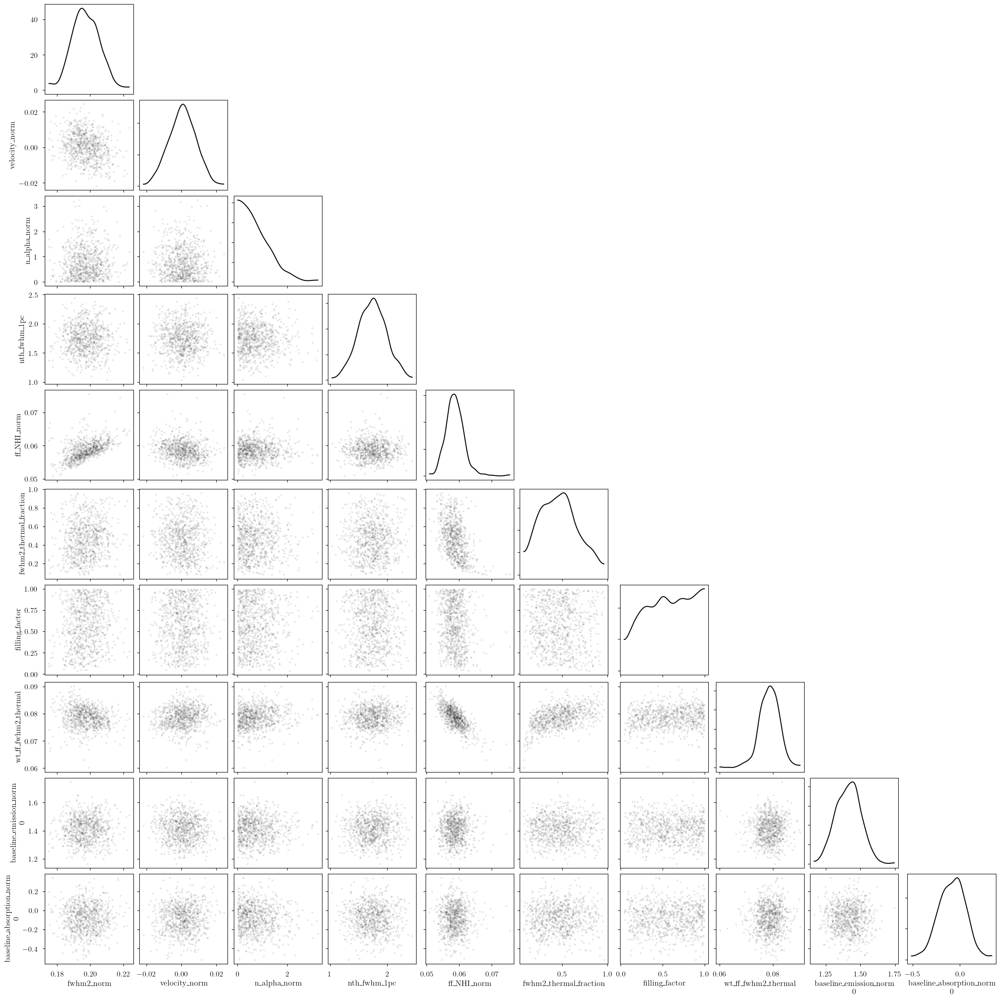

In [23]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

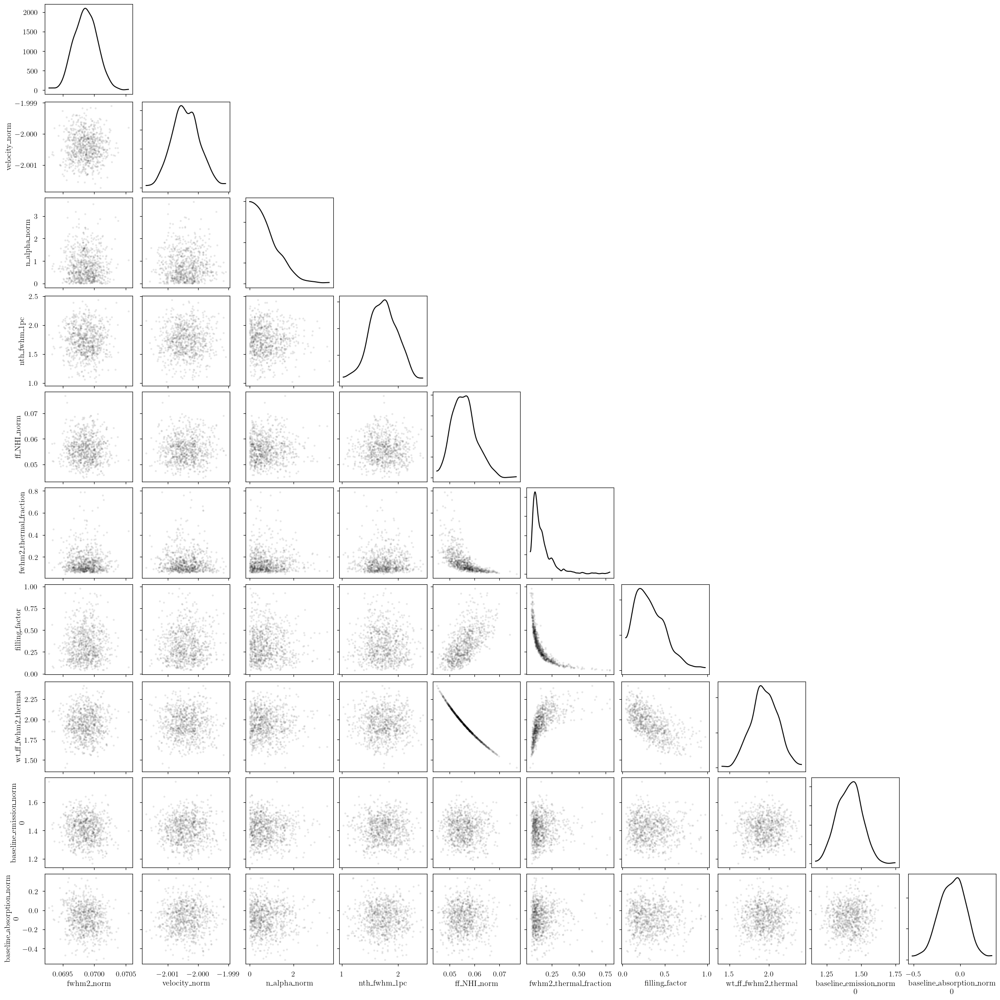

In [24]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

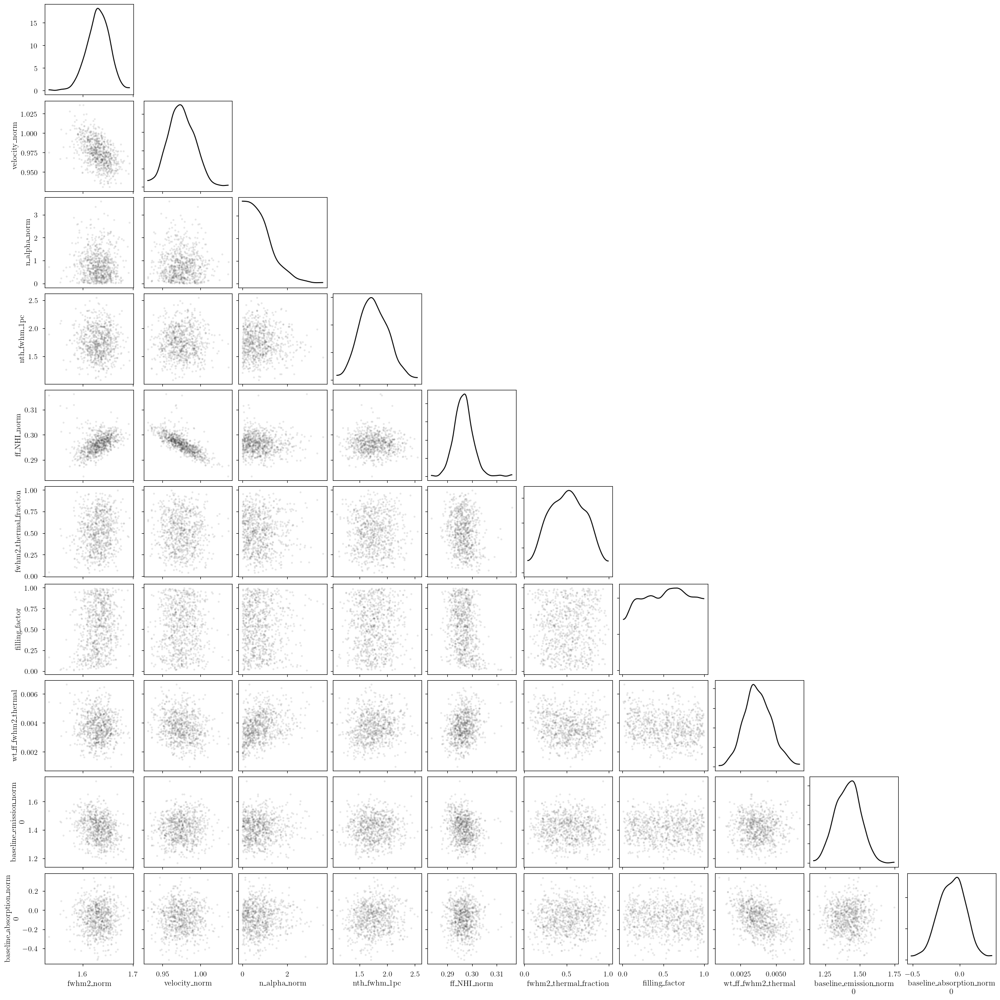

In [25]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2, draw=slice(None, None, 10)), # samples
    model.cloud_freeRVs + model.hyper_freeRVs + model.baseline_freeRVs, # var_names to plot
    kind="scatter", # plot type
)

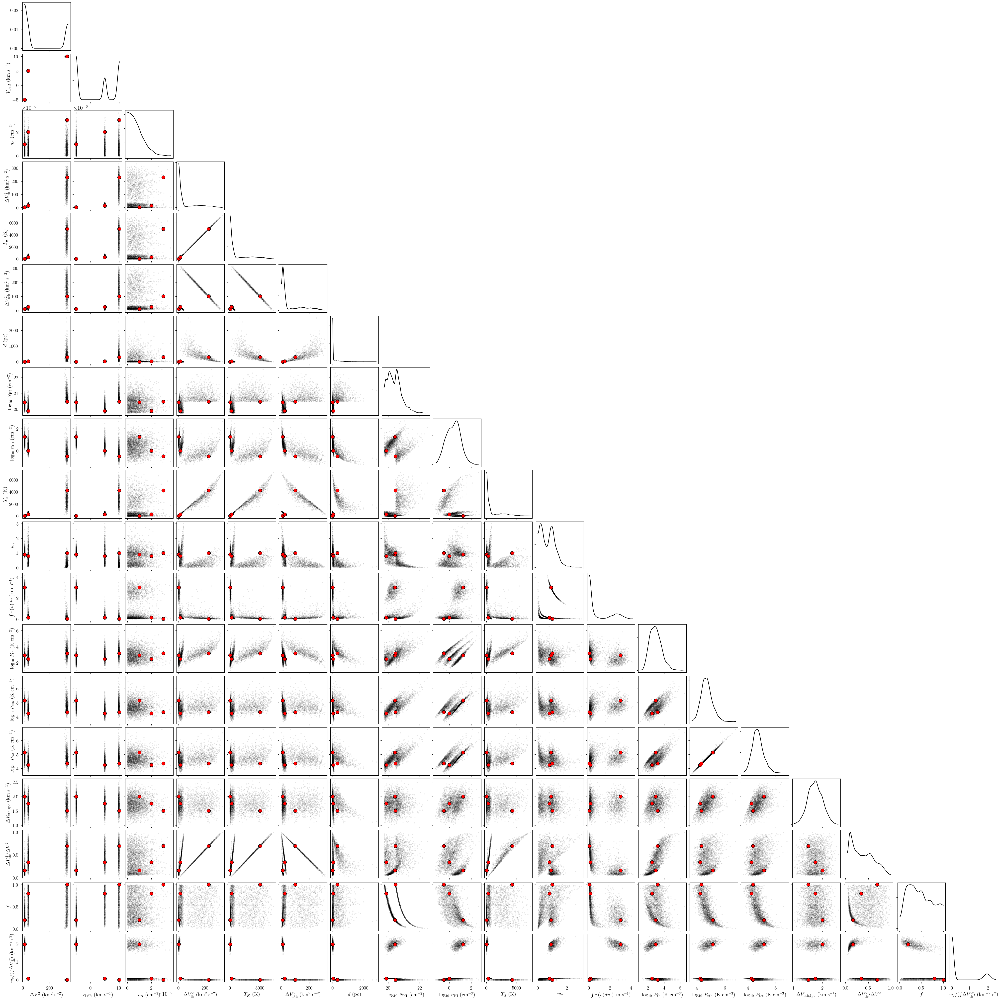

In [26]:
_ = plot_pair(
    model.trace.solution_0.sel(draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    combine_dims=["cloud"], # concatenate clouds
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=sim_params, # truths
)

In [27]:
# identify simulation cloud corresponding to each posterior cloud
sim_cloud_map = {}
for i in range(n_clouds):
    posterior_velocity = model.trace.solution_0['velocity'].sel(cloud=i).data.mean()
    match = np.argmin(np.abs(sim_params["velocity"] - posterior_velocity))
    sim_cloud_map[i] = match
sim_cloud_map

{0: np.int64(1), 1: np.int64(0), 2: np.int64(2)}

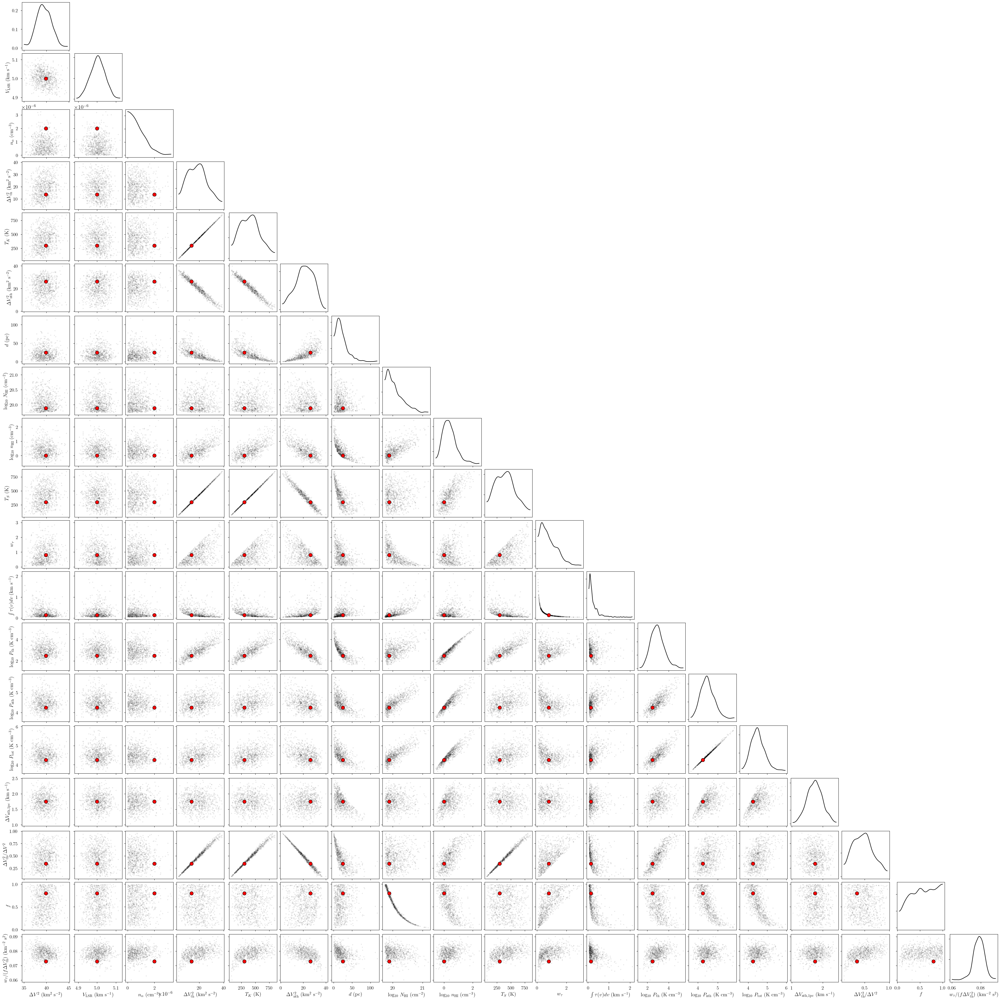

In [28]:
cloud = 0

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

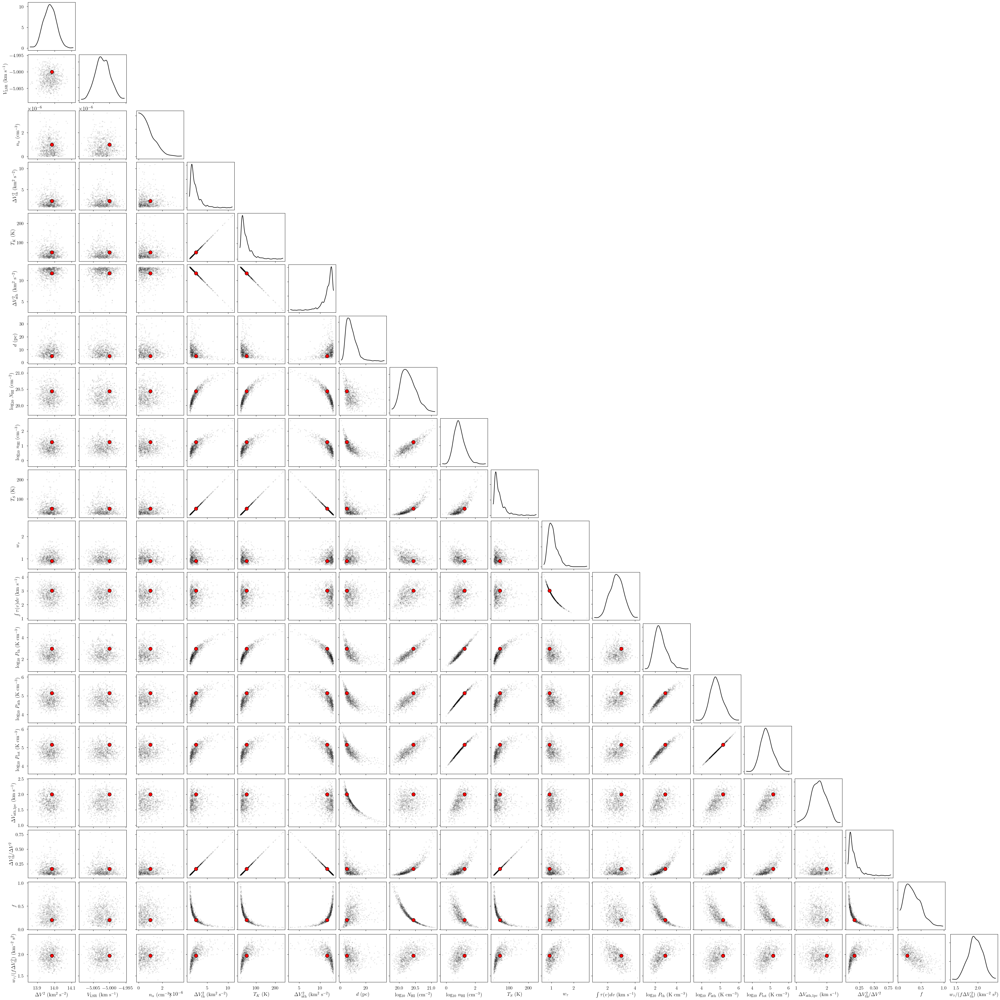

In [29]:
cloud = 1

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

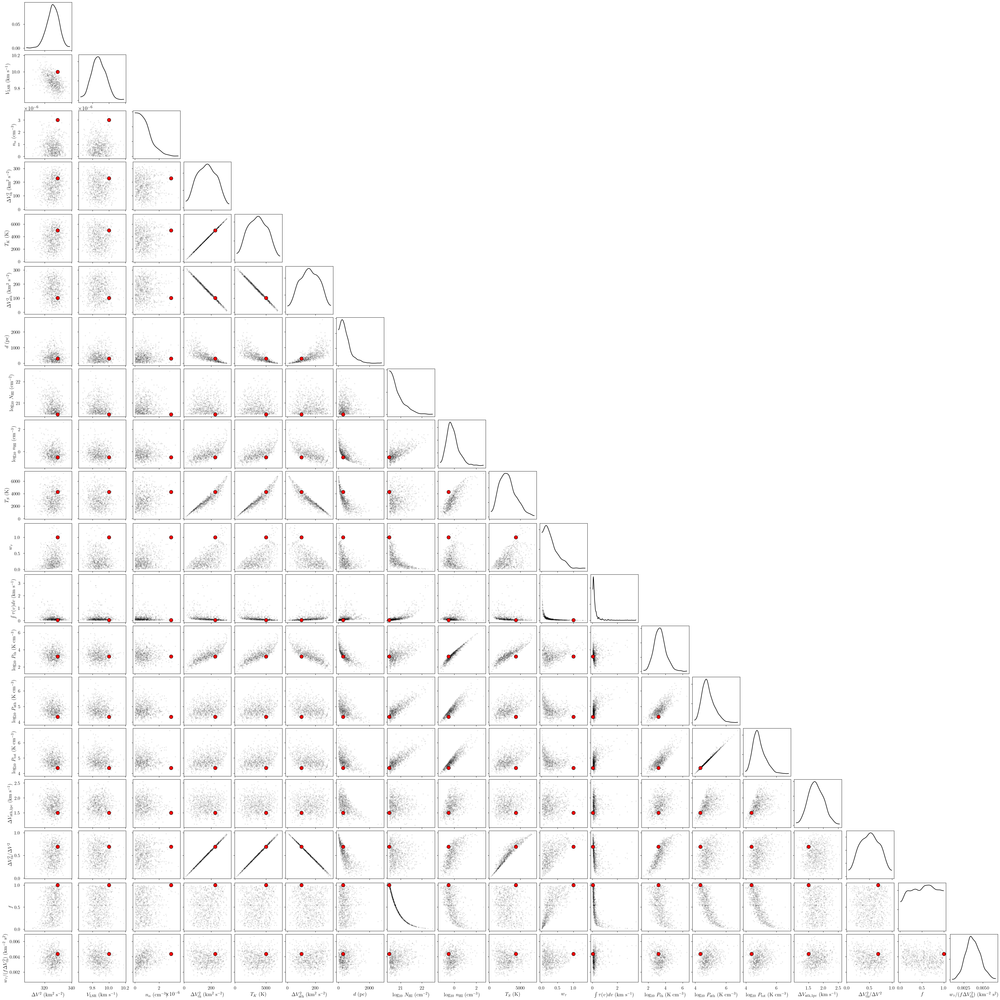

In [30]:
cloud = 2

# subset of sim_params
my_sim_params = {}
for var_name in var_names:
    my_sim_params[var_name] = sim_params[var_name][sim_cloud_map[cloud]]

_ = plot_pair(
    model.trace.solution_0.sel(cloud=cloud, draw=slice(None, None, 10)), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="scatter", # plot type
    reference_values=my_sim_params, # truths
)

In [31]:
point_stats = az.summary(model.trace.solution_0, kind="stats")
print("BIC:", model.bic())
display(point_stats)

BIC: -1252.5100256218373


,mean,sd,hdi_3%,hdi_97%
baseline_emission_norm[0],1.412,0.087,1.246,1.571
baseline_absorption_norm[0],-0.098,0.146,-0.366,0.180
velocity_norm[0],0.000,0.008,-0.013,0.015
velocity_norm[1],-2.000,0.000,-2.001,-2.000
velocity_norm[2],0.975,0.017,0.944,1.007
fwhm2_norm[0],0.197,0.008,0.182,0.213
fwhm2_norm[1],0.070,0.000,0.070,0.070
fwhm2_norm[2],1.631,0.021,1.591,1.670
n_alpha_norm[0],0.787,0.602,0.001,1.875
n_alpha_norm[1],0.801,0.617,0.000,1.919
